In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import os

In [2]:
os.chdir(r'C:\SML_Projects\SML_CVE_type_cwe_predict')

In [3]:
df = pd.read_csv("data/raw/merged/merged_dataset.csv")

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102963 entries, 0 to 102962
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   cve_id        102963 non-null  object
 1   description   102963 non-null  object
 2   cvss_score    97069 non-null   object
 3   cwe           97568 non-null   object
 4   vendor        99718 non-null   object
 5   product       99710 non-null   object
 6   publish_date  102963 non-null  object
 7   type          102963 non-null  object
dtypes: object(8)
memory usage: 6.3+ MB


In [5]:
from src.preprocessing import Preprocessing

missingValues = Preprocessing(df, target=['type', 'cvss_score'])
df = missingValues.fill_missing_values().get_dataset()

C:\Users\user\AppData\Local\Temp\ipykernel_10152\2188067761.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='type', data=df, palette='coolwarm')


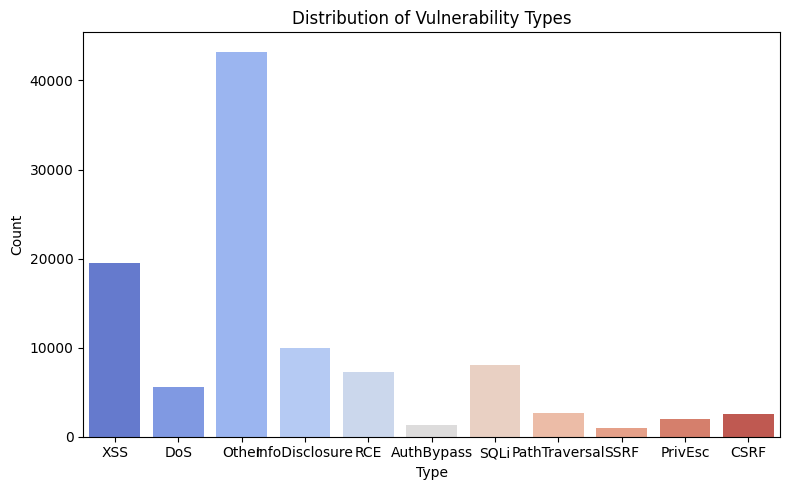

In [6]:
plt.figure(figsize=(8,5))
sns.countplot(x='type', data=df, palette='coolwarm')
plt.title("Distribution of Vulnerability Types")
plt.xlabel("Type")
plt.ylabel("Count")
plt.tight_layout()
plt.savefig('visuals/Type_Distribution.png')
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_10152\1897637286.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_cwe.index, y=top_cwe.values, palette='viridis')


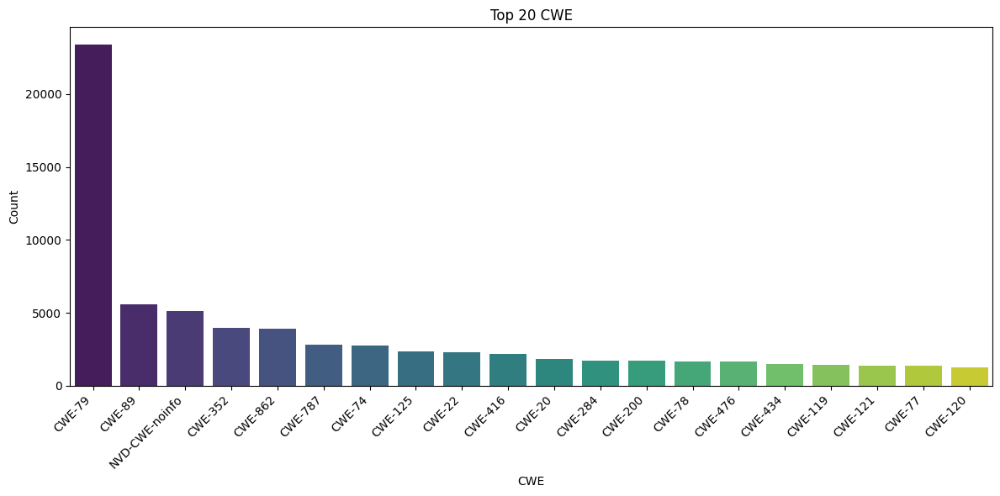

In [7]:
plt.figure(figsize=(12,6))
top_cwe = df['cwe'].value_counts().nlargest(20)
sns.barplot(x=top_cwe.index, y=top_cwe.values, palette='viridis')
plt.title("Top 20 CWE")
plt.xlabel("CWE")
plt.ylabel("Count")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('visuals/Top20_CWE.png')
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_10152\3324383129.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_vendor.index, y=top_vendor.values, palette='magma')


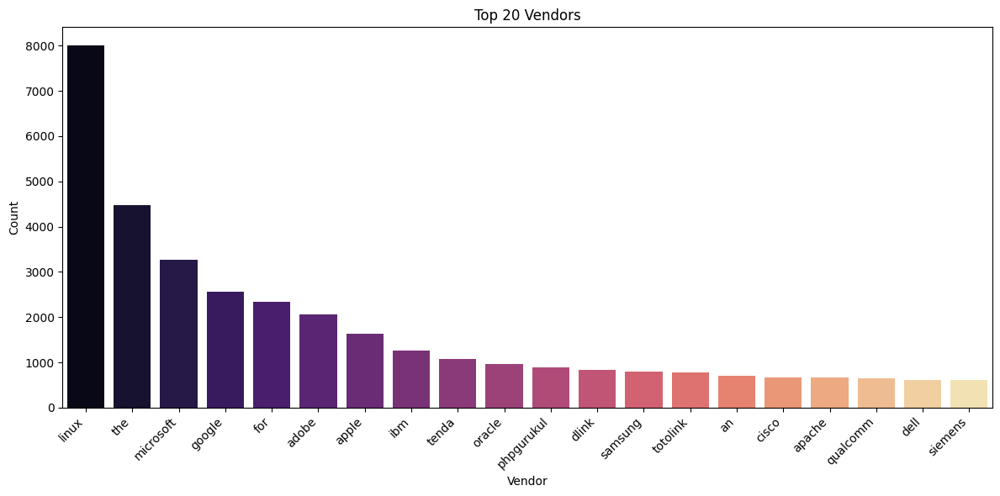

In [8]:
plt.figure(figsize=(12,6))
top_vendor = df['vendor'].value_counts().nlargest(20)
sns.barplot(x=top_vendor.index, y=top_vendor.values, palette='magma')
plt.title("Top 20 Vendors")
plt.xlabel("Vendor")
plt.ylabel("Count")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('visuals/Top20_Vendors.png')
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_10152\814383809.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_product.index, y=top_product.values, palette='coolwarm')


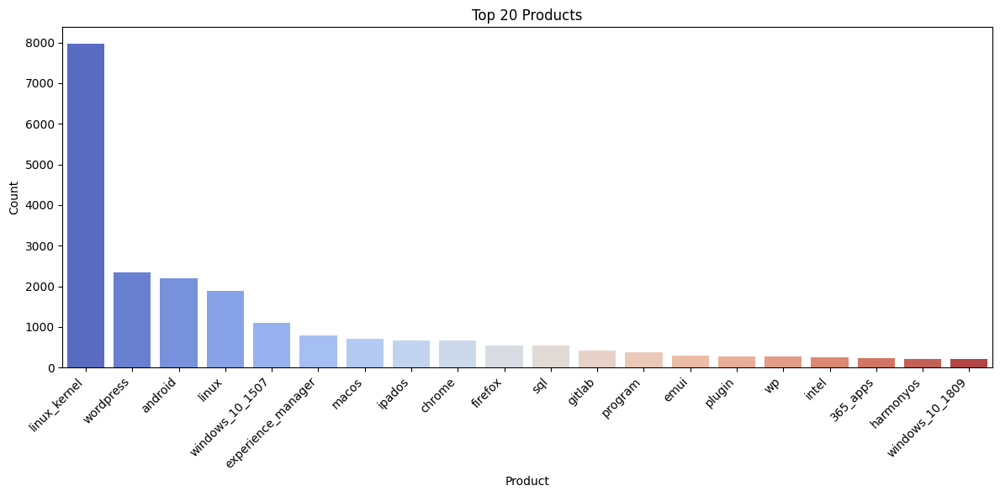

In [9]:
plt.figure(figsize=(12,6))
top_product = df['product'].value_counts().nlargest(20)
sns.barplot(x=top_product.index, y=top_product.values, palette='coolwarm')
plt.title("Top 20 Products")
plt.xlabel("Product")
plt.ylabel("Count")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('visuals/Top20_Products.png')
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_10152\4102612150.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='publish_year', data=df, palette='cubehelix')


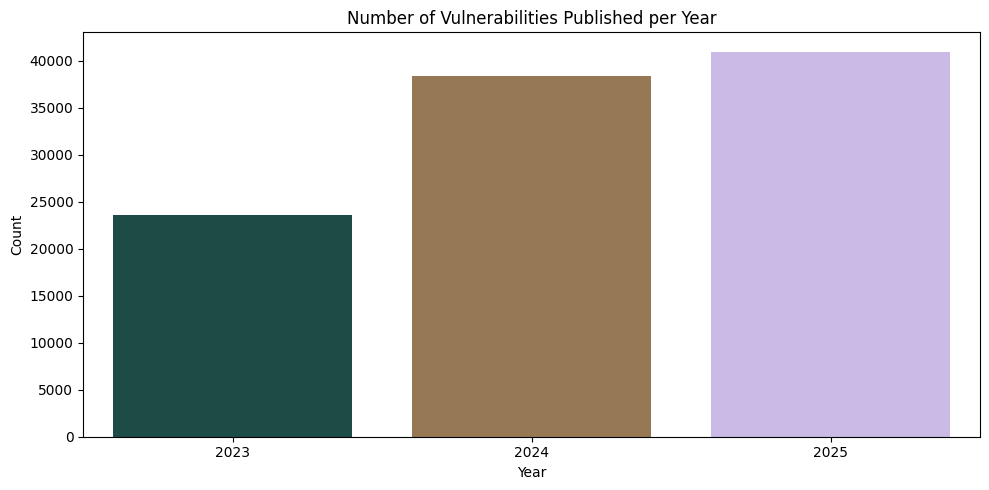

In [10]:
df['publish_year'] = pd.to_datetime(df['publish_date']).dt.year
plt.figure(figsize=(10,5))
sns.countplot(x='publish_year', data=df, palette='cubehelix')
plt.title("Number of Vulnerabilities Published per Year")
plt.xlabel("Year")
plt.ylabel("Count")
plt.tight_layout()
plt.savefig('visuals/Publish_Year_Distribution.png')
plt.show()

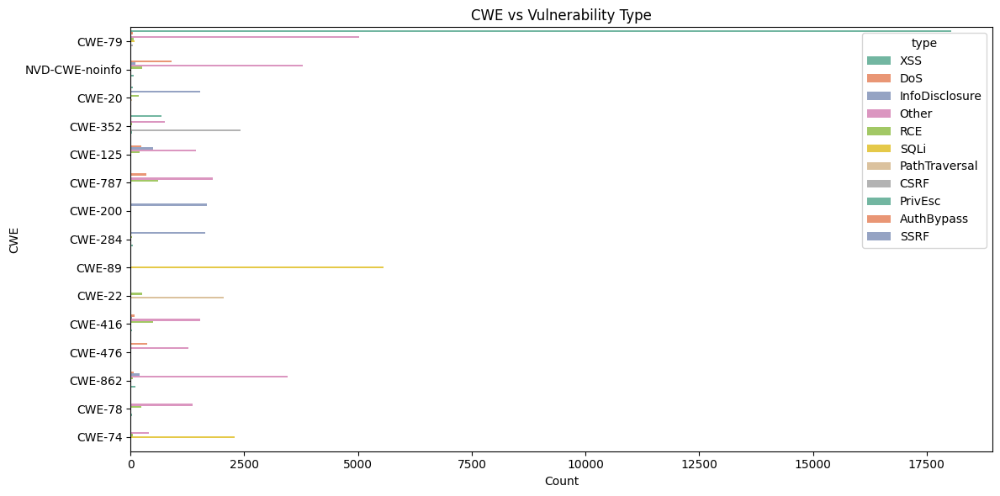

In [11]:
plt.figure(figsize=(12,6))
top_cwe = df['cwe'].value_counts().nlargest(15).index
sns.countplot(y='cwe', hue='type', data=df[df['cwe'].isin(top_cwe)], palette='Set2')
plt.title("CWE vs Vulnerability Type")
plt.xlabel("Count")
plt.ylabel("CWE")
plt.tight_layout()
plt.savefig('visuals/CWE_vs_Type.png')
plt.show()

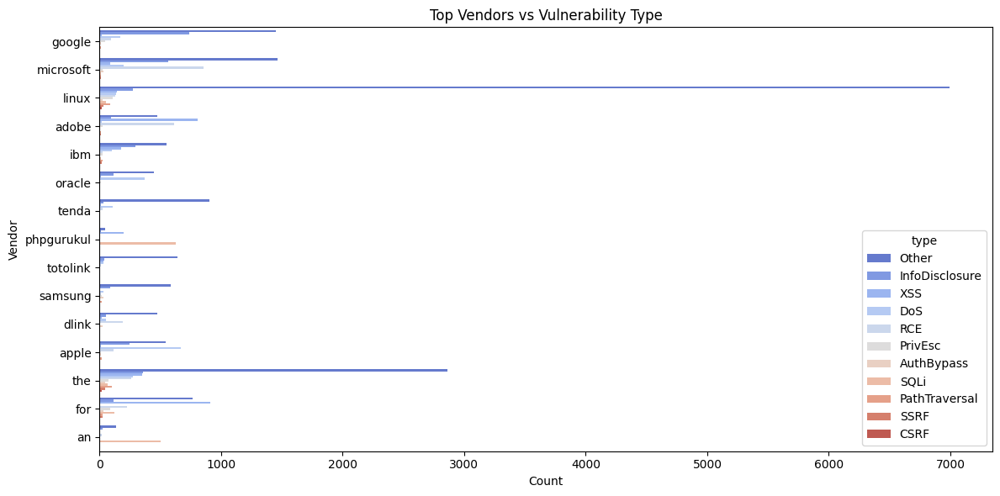

In [12]:
plt.figure(figsize=(12,6))
top_vendor = df['vendor'].value_counts().nlargest(15).index
sns.countplot(y='vendor', hue='type', data=df[df['vendor'].isin(top_vendor)], palette='coolwarm')
plt.title("Top Vendors vs Vulnerability Type")
plt.xlabel("Count")
plt.ylabel("Vendor")
plt.tight_layout()
plt.savefig('visuals/Vendor_vs_Type.png')
plt.show()

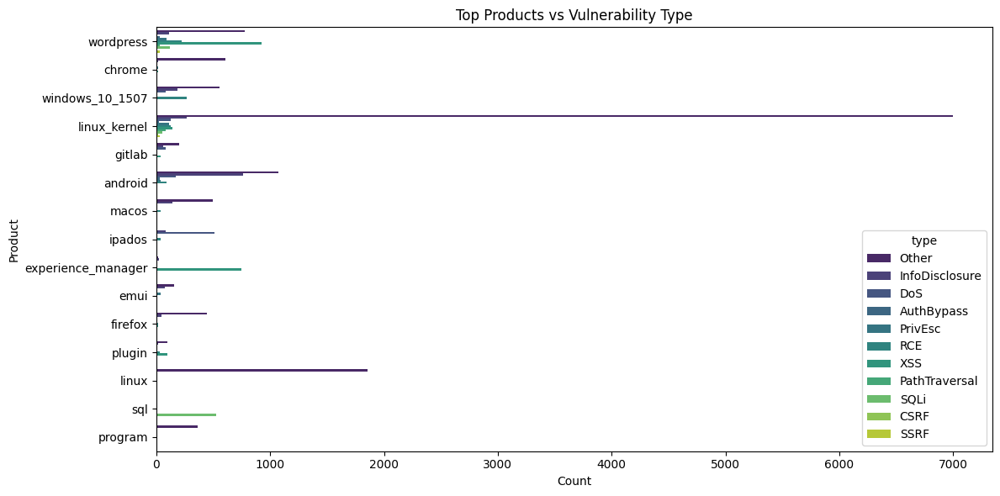

In [13]:
plt.figure(figsize=(12,6))
top_product = df['product'].value_counts().nlargest(15).index
sns.countplot(y='product', hue='type', data=df[df['product'].isin(top_product)], palette='viridis')
plt.title("Top Products vs Vulnerability Type")
plt.xlabel("Count")
plt.ylabel("Product")
plt.tight_layout()
plt.savefig('visuals/Product_vs_Type.png')
plt.show()

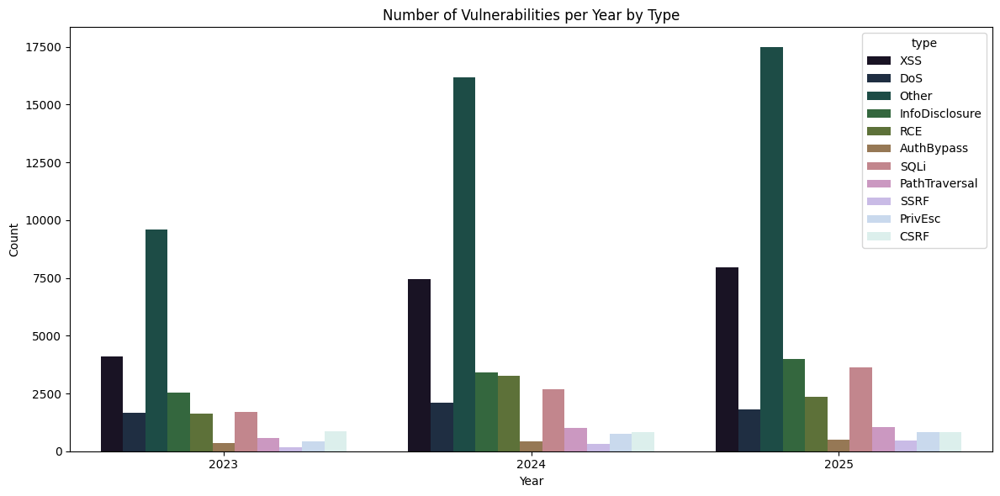

In [14]:
df['publish_year'] = pd.to_datetime(df['publish_date']).dt.year
plt.figure(figsize=(12,6))
sns.countplot(x='publish_year', hue='type', data=df, palette='cubehelix')
plt.title("Number of Vulnerabilities per Year by Type")
plt.xlabel("Year")
plt.ylabel("Count")
plt.tight_layout()
plt.savefig('visuals/PublishYear_vs_Type.png')
plt.show()

In [19]:
cvss_map = {
    'Low': 3,
    'Medium': 5,
    'High': 7,
    'Critical': 9
}

df['cvss_numeric'] = df['cvss_score'].map(cvss_map)

df_plot = df.dropna(subset=['cvss_numeric', 'type'])

fig = px.scatter(
    df_plot,
    x='cvss_numeric',
    y='type',
    color='type',
    size='cvss_numeric',
    hover_data=['cve_id', 'vendor', 'product', 'cwe'],
    title="CVSS Score (Numeric) vs Type Bubble Plot"
)
fig.show()

In [ ]:
fig = px.bar(
    df_plot.groupby('type')['cvss_numeric'].mean().reset_index(),
    x='type',
    y='cvss_numeric',
    title="Average CVSS Score by Vulnerability Type"
)
fig.show()
